In [4]:
import numpy as np
import pandas as pd

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt

In [6]:
data = pd.read_csv('/content/digital_marketing_campaign_dataset - digital_marketing_campaign_dataset.csv (1).csv')

In [7]:
data.head()

,CustomerID,Age,Gender,Income,CampaignChannel,CampaignType,AdSpend,ClickThroughRate,ConversionRate,WebsiteVisits,PagesPerVisit,TimeOnSite,SocialShares,EmailOpens,EmailClicks,PreviousPurchases,LoyaltyPoints,AdvertisingPlatform,AdvertisingTool,Conversion
0,8000,56,Female,136912,Social Media,Awareness,6497.870068,0.043919,0.088031,0,2.399017,7.396803,19,6,9,4,688,IsConfid,ToolConfid,1
1,8001,69,Male,41760,Email,Retention,3898.668606,0.155725,0.182725,42,2.917138,5.352549,5,2,7,2,3459,IsConfid,ToolConfid,1
2,8002,46,Female,88456,PPC,Awareness,1546.429596,0.277490,0.076423,2,8.223619,13.794901,0,11,2,8,2337,IsConfid,ToolConfid,1
3,8003,32,Female,44085,PPC,Conversion,539.525936,0.137611,0.088004,47,4.540939,14.688363,89,2,2,0,2463,IsConfid,ToolConfid,1
4,8004,60,Female,83964,PPC,Conversion,1678.043573,0.252851,0.109940,0,2.046847,13.993370,6,6,6,8,4345,IsConfid,ToolConfid,1


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8000 entries, 0 to 7999
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CustomerID           8000 non-null   int64  
 1   Age                  8000 non-null   int64  
 2   Gender               8000 non-null   object 
 3   Income               8000 non-null   int64  
 4   CampaignChannel      8000 non-null   object 
 5   CampaignType         8000 non-null   object 
 6   AdSpend              8000 non-null   float64
 7   ClickThroughRate     8000 non-null   float64
 8   ConversionRate       8000 non-null   float64
 9   WebsiteVisits        8000 non-null   int64  
 10  PagesPerVisit        8000 non-null   float64
 11  TimeOnSite           8000 non-null   float64
 12  SocialShares         8000 non-null   int64  
 13  EmailOpens           8000 non-null   int64  
 14  EmailClicks          8000 non-null   int64  
 15  PreviousPurchases    8000 non-null   i

In [9]:
data.shape

(8000, 20)

On observation we see that there are 3 columns which are actually of no use for the purpose of analytics so we will consider dropping them:

1. Advertising Tool
2. Advertising Platform
3. Customer ID

In [10]:
columns_to_drop = ['AdvertisingTool','AdvertisingPlatform','CustomerID']

In [11]:
data = data.drop(columns=columns_to_drop)

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8000 entries, 0 to 7999
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Age                8000 non-null   int64  
 1   Gender             8000 non-null   object 
 2   Income             8000 non-null   int64  
 3   CampaignChannel    8000 non-null   object 
 4   CampaignType       8000 non-null   object 
 5   AdSpend            8000 non-null   float64
 6   ClickThroughRate   8000 non-null   float64
 7   ConversionRate     8000 non-null   float64
 8   WebsiteVisits      8000 non-null   int64  
 9   PagesPerVisit      8000 non-null   float64
 10  TimeOnSite         8000 non-null   float64
 11  SocialShares       8000 non-null   int64  
 12  EmailOpens         8000 non-null   int64  
 13  EmailClicks        8000 non-null   int64  
 14  PreviousPurchases  8000 non-null   int64  
 15  LoyaltyPoints      8000 non-null   int64  
 16  Conversion         8000 

In [13]:
data.head()

,Age,Gender,Income,CampaignChannel,CampaignType,AdSpend,ClickThroughRate,ConversionRate,WebsiteVisits,PagesPerVisit,TimeOnSite,SocialShares,EmailOpens,EmailClicks,PreviousPurchases,LoyaltyPoints,Conversion
0,56,Female,136912,Social Media,Awareness,6497.870068,0.043919,0.088031,0,2.399017,7.396803,19,6,9,4,688,1
1,69,Male,41760,Email,Retention,3898.668606,0.155725,0.182725,42,2.917138,5.352549,5,2,7,2,3459,1
2,46,Female,88456,PPC,Awareness,1546.429596,0.277490,0.076423,2,8.223619,13.794901,0,11,2,8,2337,1
3,32,Female,44085,PPC,Conversion,539.525936,0.137611,0.088004,47,4.540939,14.688363,89,2,2,0,2463,1
4,60,Female,83964,PPC,Conversion,1678.043573,0.252851,0.109940,0,2.046847,13.993370,6,6,6,8,4345,1


In [14]:
data.describe()

,Age,Income,AdSpend,ClickThroughRate,ConversionRate,WebsiteVisits,PagesPerVisit,TimeOnSite,SocialShares,EmailOpens,EmailClicks,PreviousPurchases,LoyaltyPoints,Conversion
count,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000
mean,43.625500,84664.196750,5000.944830,0.154829,0.104389,24.751625,5.549299,7.727718,49.799750,9.476875,4.467375,4.485500,2490.268500,0.876500
std,14.902785,37580.387945,2838.038153,0.084007,0.054878,14.312269,2.607358,4.228218,28.901165,5.711111,2.856564,2.888093,1429.527162,0.329031
min,18.000000,20014.000000,100.054813,0.010005,0.010018,0.000000,1.000428,0.501669,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,31.000000,51744.500000,2523.221165,0.082635,0.056410,13.000000,3.302479,4.068340,25.000000,5.000000,2.000000,2.000000,1254.750000,1.000000
50%,43.000000,84926.500000,5013.440044,0.154505,0.104046,25.000000,5.534257,7.682956,50.000000,9.000000,4.000000,4.000000,2497.000000,1.000000
75%,56.000000,116815.750000,7407.989369,0.228207,0.152077,37.000000,7.835756,11.481468,75.000000,14.000000,7.000000,7.000000,3702.250000,1.000000
max,69.000000,149986.000000,9997.914781,0.299968,0.199995,49.000000,9.999055,14.995311,99.000000,19.000000,9.000000,9.000000,4999.000000,1.000000


In [15]:
data.isnull().sum()

,0
Age,0
Gender,0
Income,0
CampaignChannel,0
CampaignType,0
AdSpend,0
ClickThroughRate,0
ConversionRate,0
WebsiteVisits,0
PagesPerVisit,0


In [16]:
data.duplicated().sum()

0

Now, for a better understanding of the parameters let us plot the data

In [17]:
data.columns

Index(['Age', 'Gender', 'Income', 'CampaignChannel', 'CampaignType', 'AdSpend',
       'ClickThroughRate', 'ConversionRate', 'WebsiteVisits', 'PagesPerVisit',
       'TimeOnSite', 'SocialShares', 'EmailOpens', 'EmailClicks',
       'PreviousPurchases', 'LoyaltyPoints', 'Conversion'],
      dtype='object')

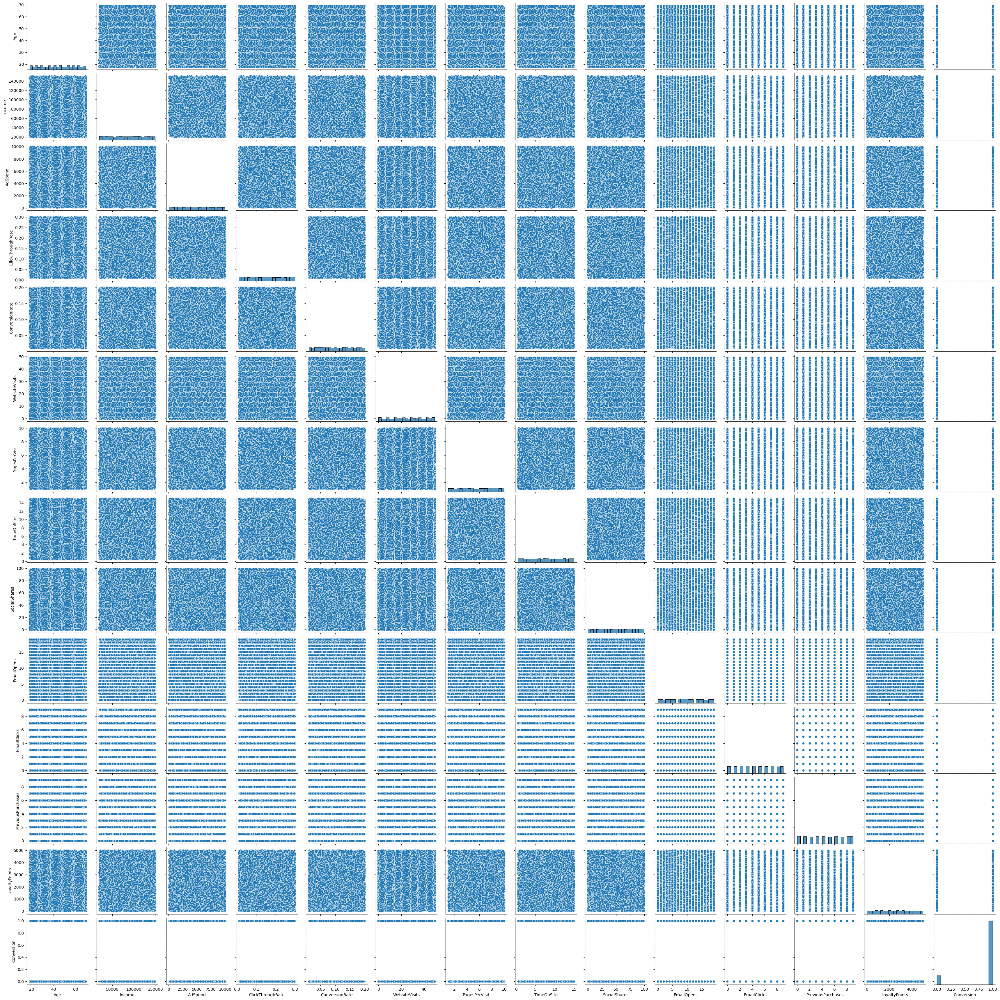

In [18]:
sns.pairplot(data)

KDE- KERNEL DENSITY ESTIMATION

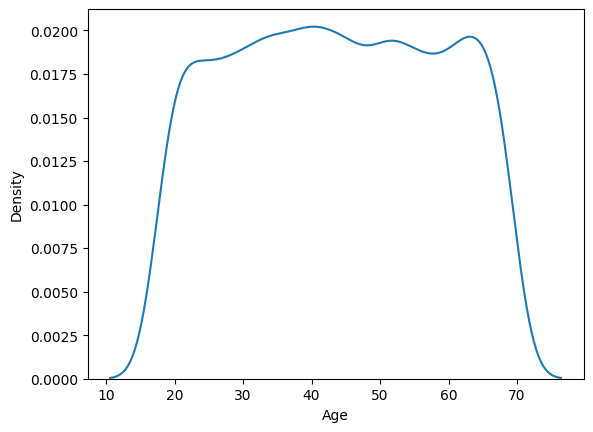

In [19]:
sns.kdeplot(data = data['Age'])
plt.show()

NOW, WE WILL PLOT THE KDE PLOTS FOR ALL THE NUMERICAL PARAMETERS FOR BETTER ANALYTICS TO UNDERSTAND THE USERBASE TRENDS

In [20]:
data.columns

Index(['Age', 'Gender', 'Income', 'CampaignChannel', 'CampaignType', 'AdSpend',
       'ClickThroughRate', 'ConversionRate', 'WebsiteVisits', 'PagesPerVisit',
       'TimeOnSite', 'SocialShares', 'EmailOpens', 'EmailClicks',
       'PreviousPurchases', 'LoyaltyPoints', 'Conversion'],
      dtype='object')

In [21]:
num_df = ['AdSpend',
       'ClickThroughRate', 'ConversionRate', 'WebsiteVisits', 'PagesPerVisit',
       'TimeOnSite', 'SocialShares', 'EmailOpens', 'EmailClicks',
       'PreviousPurchases', 'LoyaltyPoints']

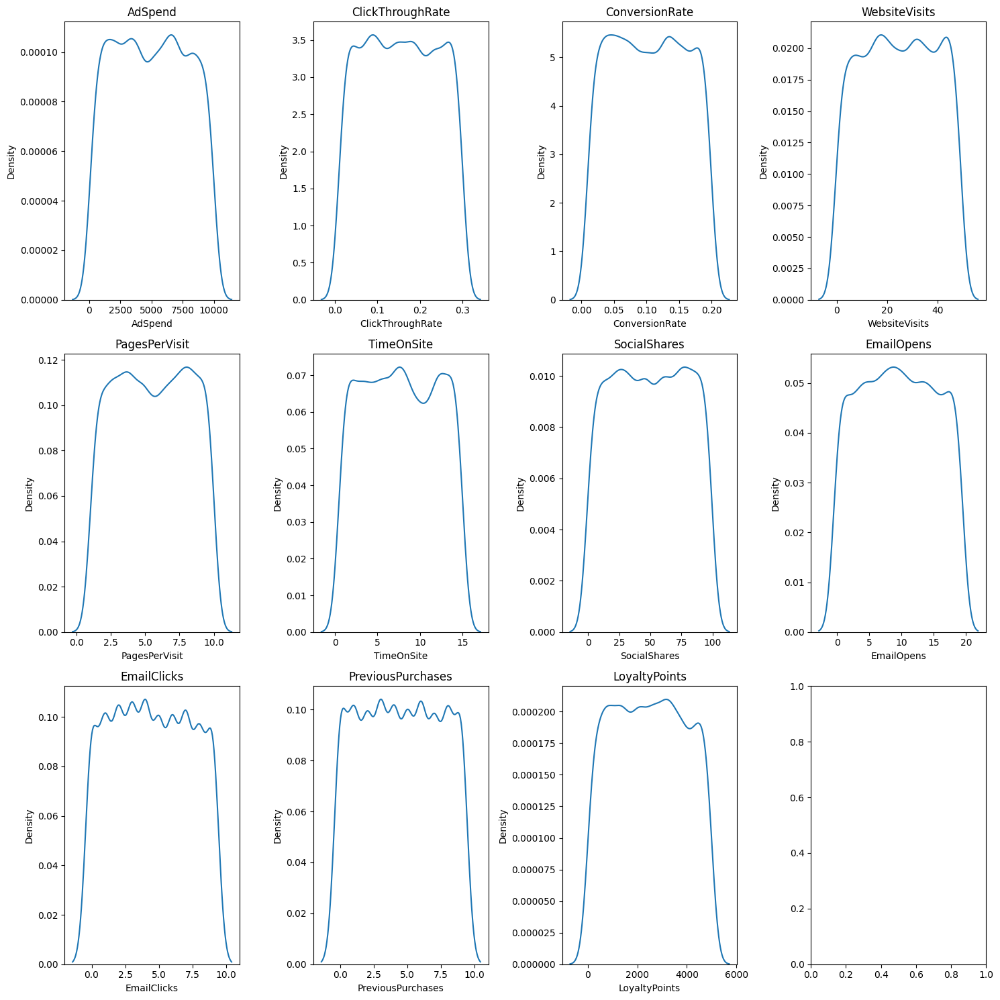

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'data' is your DataFrame
fig, axes = plt.subplots(3, 4, figsize=(15, 15))  # figsize is now correctly used
axes = axes.flatten()

for i, col in enumerate(num_df):  # Iterate directly over the list elements
    sns.kdeplot(data=data[col], ax=axes[i])  # Assuming 'data' is your DataFrame
    axes[i].set_title(col)

plt.tight_layout()
plt.show()

In [23]:
data['Gender'].value_counts().reset_index()

,Gender,count
0,Female,4839
1,Male,3161


from matplotlib import pyplot as plt
_df_0['count'].plot(kind='hist', bins=20, title='count')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_1.groupby('Gender').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2['count'].plot(kind='line', figsize=(8, 4), title='count')
plt.gca().spines[['top', 'right']].set_visible(False)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_3['Gender'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_3, x='count', y='Gender', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

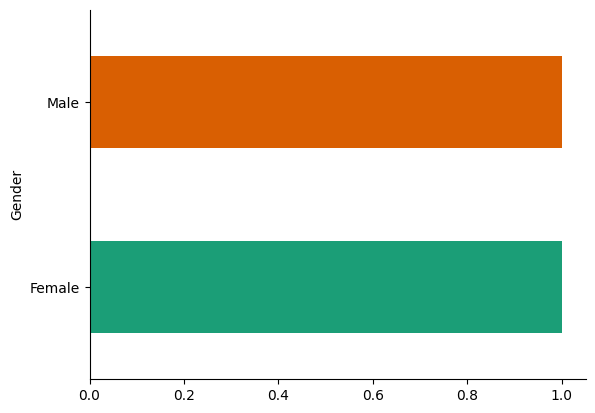

In [26]:
from matplotlib import pyplot as plt
import seaborn as sns
_df_1.groupby('Gender').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

In [27]:
data['Age'].value_counts().reset_index()

,Age,count
0,64,187
1,62,182
2,43,178
3,66,178
4,34,177
5,49,173
6,45,173
7,52,172
8,40,170
9,42,167


from matplotlib import pyplot as plt
_df_4['Age'].plot(kind='hist', bins=20, title='Age')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_5['count'].plot(kind='hist', bins=20, title='count')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_6.plot(kind='scatter', x='Age', y='count', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_7['Age'].plot(kind='line', figsize=(8, 4), title='Age')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_8['count'].plot(kind='line', figsize=(8, 4), title='count')
plt.gca().spines[['top', 'right']].set_visible(False)

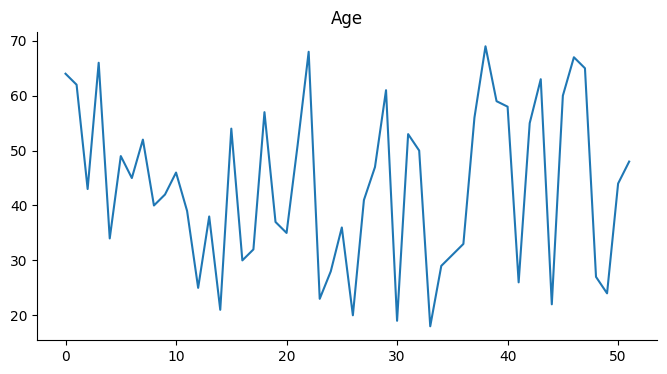

In [30]:
from matplotlib import pyplot as plt
_df_7['Age'].plot(kind='line', figsize=(8, 4), title='Age')
plt.gca().spines[['top', 'right']].set_visible(False)

In [31]:
data['CampaignChannel'].value_counts().reset_index()

,CampaignChannel,count
0,Referral,1719
1,PPC,1655
2,Email,1557
3,SEO,1550
4,Social Media,1519


from matplotlib import pyplot as plt
_df_9['count'].plot(kind='hist', bins=20, title='count')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_10.groupby('CampaignChannel').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_11['count'].plot(kind='line', figsize=(8, 4), title='count')
plt.gca().spines[['top', 'right']].set_visible(False)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_12['CampaignChannel'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_12, x='count', y='CampaignChannel', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

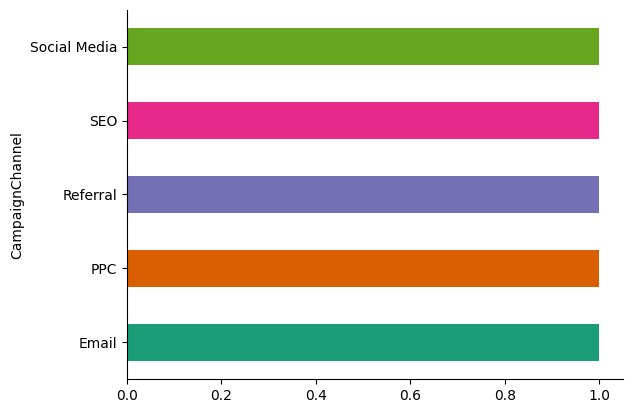

In [32]:
from matplotlib import pyplot as plt
import seaborn as sns
_df_10.groupby('CampaignChannel').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

In [33]:
data['CampaignType'].value_counts().reset_index()

,CampaignType,count
0,Conversion,2077
1,Awareness,1988
2,Consideration,1988
3,Retention,1947


from matplotlib import pyplot as plt
_df_13['count'].plot(kind='hist', bins=20, title='count')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_14.groupby('CampaignType').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_15['count'].plot(kind='line', figsize=(8, 4), title='count')
plt.gca().spines[['top', 'right']].set_visible(False)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_16['CampaignType'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_16, x='count', y='CampaignType', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

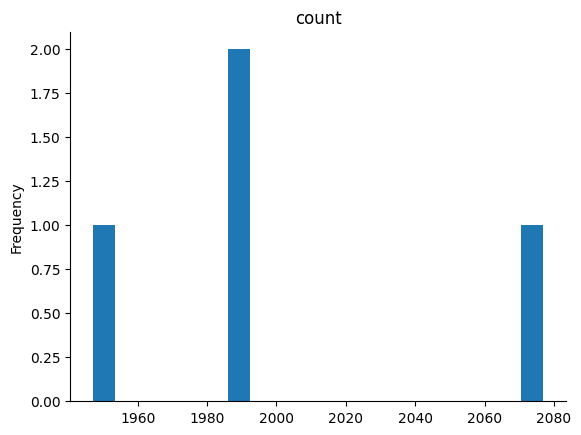

In [34]:
from matplotlib import pyplot as plt
_df_13['count'].plot(kind='hist', bins=20, title='count')
plt.gca().spines[['top', 'right',]].set_visible(False)

NOW WE WILL DERIVE NECCESSARY PARAMETERS FROM THE GIVEN RAW DATA FOR ACTIONABLE MARKETING INSIGHTS AND STRATEGIES FORMATION FOR
#THE LUXURY CLOSET

#PROBLEM STATEMENT 1:
FOR A PARTICULAR AGE GROUP WHICH CAMAPAIGN CHANNEL WILL GET CONVERTED INTO MOST EFFECTIVE A PURCHASE RATE

In [35]:
def age_category(row):
  if row['Age']<=12:
    return 'Kid'
  elif 13 <= row['Age'] <= 18:
    return 'Teen'
  elif 19 <= row['Age'] <= 25:
    return 'Young Adult'
  elif 26 <= row['Age'] <= 40:
    return 'Adult'
  elif 41 <= row['Age'] <= 55:
    return 'Middle Age Adult'
  elif 56 <= row['Age'] <= 70:
    return 'Senior Citizen'
  else:
    return 'Retired'

In [36]:
data['AgeCategory']= data.apply(age_category, axis=1)

In [37]:
data.head()

,Age,Gender,Income,CampaignChannel,CampaignType,AdSpend,ClickThroughRate,ConversionRate,WebsiteVisits,PagesPerVisit,TimeOnSite,SocialShares,EmailOpens,EmailClicks,PreviousPurchases,LoyaltyPoints,Conversion,AgeCategory
0,56,Female,136912,Social Media,Awareness,6497.870068,0.043919,0.088031,0,2.399017,7.396803,19,6,9,4,688,1,Senior Citizen
1,69,Male,41760,Email,Retention,3898.668606,0.155725,0.182725,42,2.917138,5.352549,5,2,7,2,3459,1,Senior Citizen
2,46,Female,88456,PPC,Awareness,1546.429596,0.277490,0.076423,2,8.223619,13.794901,0,11,2,8,2337,1,Middle Age Adult
3,32,Female,44085,PPC,Conversion,539.525936,0.137611,0.088004,47,4.540939,14.688363,89,2,2,0,2463,1,Adult
4,60,Female,83964,PPC,Conversion,1678.043573,0.252851,0.109940,0,2.046847,13.993370,6,6,6,8,4345,1,Senior Citizen


In [38]:
data['AgeCategory'].value_counts().reset_index()

,AgeCategory,count
0,Middle Age Adult,2333
1,Adult,2328
2,Senior Citizen,2146
3,Young Adult,1045
4,Teen,148


from matplotlib import pyplot as plt
_df_17['count'].plot(kind='hist', bins=20, title='count')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_18.groupby('AgeCategory').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_19['count'].plot(kind='line', figsize=(8, 4), title='count')
plt.gca().spines[['top', 'right']].set_visible(False)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_20['AgeCategory'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_20, x='count', y='AgeCategory', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

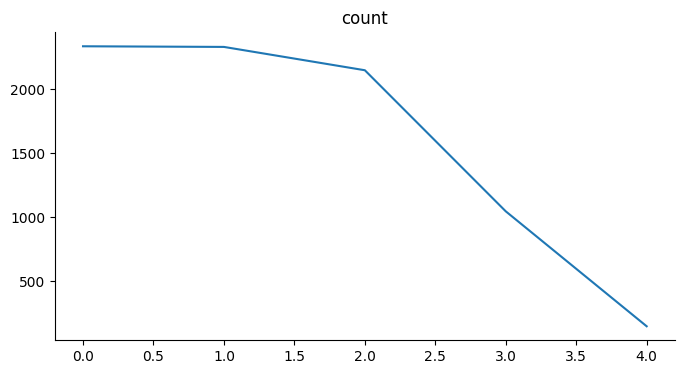

In [40]:
from matplotlib import pyplot as plt
_df_19['count'].plot(kind='line', figsize=(8, 4), title='count')
plt.gca().spines[['top', 'right']].set_visible(False)

In [41]:
data.groupby(['AgeCategory','CampaignChannel'])['PreviousPurchases'].mean()

AgeCategory       CampaignChannel
Adult             Email              4.681818
                  PPC                4.643154
                  Referral           4.720648
                  SEO                4.474771
                  Social Media       4.361111
Middle Age Adult  Email              4.478060
                  PPC                4.432258
                  Referral           4.327869
                  SEO                4.452586
                  Social Media       4.476190
Senior Citizen    Email              4.500000
                  PPC                4.246725
                  Referral           4.522917
                  SEO                4.520930
                  Social Media       4.544503
Teen              Email              3.960000
                  PPC                4.575758
                  Referral           3.575758
                  SEO                4.800000
                  Social Media       4.925926
Young Adult       Email              4.625571
                  PPC                4.244240
                  Referral           4.357143
                  SEO                4.736842
                  Social Media       4.307692
Name: PreviousPurchases, dtype: float64

#CONCLUSIONS DRAWN FROM PROBLEM STATEMENT 1:
1. FOR ADULT CATEGORY - REFERRALS ARE THE BEST D-MARKETING CAMPAIGN CHANNEL
2. FOR MID AGED ADULT- EMAILS ARE THE BEST D-MARKETING STRATEGY
3. FOR SENIOR CITIZEN - SOCIAL MEDIA IS THE BEST D-MARKETING STRATEGY
4. FOR TEENAGERS- SEO IS THE BEST D-MARKETING STRATEGY
5. FOR YOUNG ADULTS- SEO IS THE BEST D-MARKETING STRATEGY

#PROBLEM STATEMENT:2
FOR A PARTICULAR GENDER AND CAMPAIGN TYPE WHICH CAMPAIGN CHANNEL PROVES BE THE MOST EFFECTIVE ONE

In [42]:
#MEASURE OF EFFECTIVENESS:
#% CONVERSION


In [45]:
data.groupby(['Gender','CampaignChannel','CampaignType'])['Conversion'].agg(['sum','size']).reset_index()

,Gender,CampaignChannel,CampaignType,sum,size
0,Female,Email,Awareness,188,233
1,Female,Email,Consideration,204,236
2,Female,Email,Conversion,246,262
3,Female,Email,Retention,185,225
4,Female,PPC,Awareness,211,243
5,Female,PPC,Consideration,210,240
6,Female,PPC,Conversion,265,279
7,Female,PPC,Retention,202,238
8,Female,Referral,Awareness,235,269
9,Female,Referral,Consideration,213,248


from matplotlib import pyplot as plt
_df_21['sum'].plot(kind='hist', bins=20, title='sum')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_22['size'].plot(kind='hist', bins=20, title='size')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_23.groupby('Gender').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_24.groupby('CampaignChannel').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_25.groupby('CampaignType').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_26.plot(kind='scatter', x='sum', y='size', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_27['sum'].plot(kind='line', figsize=(8, 4), title='sum')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_28['size'].plot(kind='line', figsize=(8, 4), title='size')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['CampaignChannel'].value_counts()
    for x_label, grp in _df_29.groupby('Gender')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Gender')
_ = plt.ylabel('CampaignChannel')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['CampaignType'].value_counts()
    for x_label, grp in _df_30.groupby('CampaignChannel')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('CampaignChannel')
_ = plt.ylabel('CampaignType')

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_31['Gender'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_31, x='sum', y='Gender', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_32['CampaignChannel'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_32, x='sum', y='CampaignChannel', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_33['CampaignType'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_33, x='sum', y='CampaignType', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_34['Gender'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_34, x='size', y='Gender', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

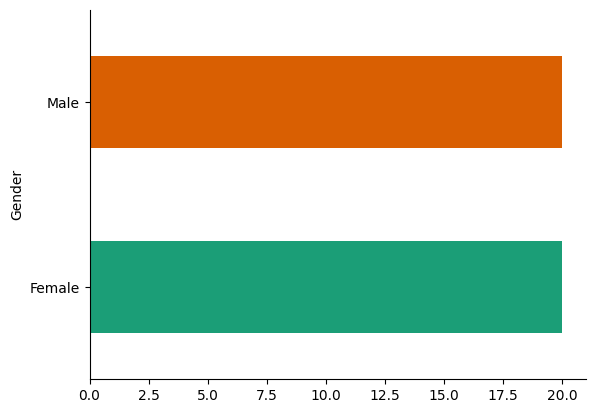

In [49]:
from matplotlib import pyplot as plt
import seaborn as sns
_df_23.groupby('Gender').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

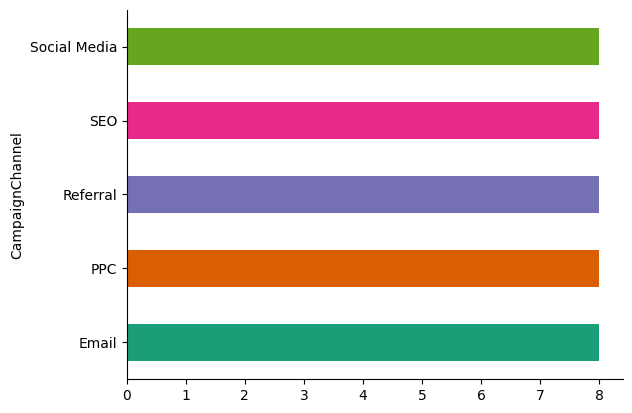

In [48]:
from matplotlib import pyplot as plt
import seaborn as sns
_df_24.groupby('CampaignChannel').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

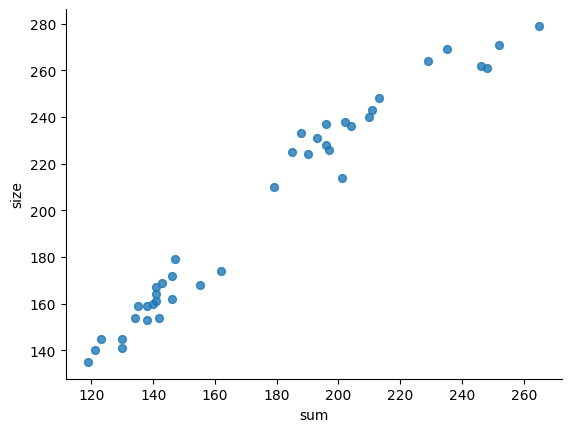

In [47]:
from matplotlib import pyplot as plt
_df_26.plot(kind='scatter', x='sum', y='size', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

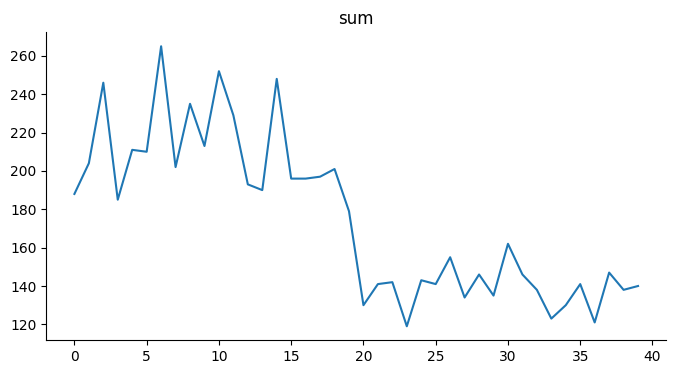

In [46]:
from matplotlib import pyplot as plt
_df_27['sum'].plot(kind='line', figsize=(8, 4), title='sum')
plt.gca().spines[['top', 'right']].set_visible(False)

In [43]:
grouped= data.groupby(['Gender','CampaignChannel','CampaignType'])['Conversion'].agg(['sum','size']).reset_index()

In [50]:
grouped

,Gender,CampaignChannel,CampaignType,sum,size
0,Female,Email,Awareness,188,233
1,Female,Email,Consideration,204,236
2,Female,Email,Conversion,246,262
3,Female,Email,Retention,185,225
4,Female,PPC,Awareness,211,243
5,Female,PPC,Consideration,210,240
6,Female,PPC,Conversion,265,279
7,Female,PPC,Retention,202,238
8,Female,Referral,Awareness,235,269
9,Female,Referral,Consideration,213,248


In [51]:
grouped['ConversionPercentage']= grouped['sum']/grouped['size']*100

In [52]:
grouped.head()

,Gender,CampaignChannel,CampaignType,sum,size,ConversionPercentage
0,Female,Email,Awareness,188,233,80.686695
1,Female,Email,Consideration,204,236,86.440678
2,Female,Email,Conversion,246,262,93.893130
3,Female,Email,Retention,185,225,82.222222
4,Female,PPC,Awareness,211,243,86.831276


In [53]:
grouped

,Gender,CampaignChannel,CampaignType,sum,size,ConversionPercentage
0,Female,Email,Awareness,188,233,80.686695
1,Female,Email,Consideration,204,236,86.440678
2,Female,Email,Conversion,246,262,93.893130
3,Female,Email,Retention,185,225,82.222222
4,Female,PPC,Awareness,211,243,86.831276
5,Female,PPC,Consideration,210,240,87.500000
6,Female,PPC,Conversion,265,279,94.982079
7,Female,PPC,Retention,202,238,84.873950
8,Female,Referral,Awareness,235,269,87.360595
9,Female,Referral,Consideration,213,248,85.887097


In [54]:
grouped.sort_values(by=['CampaignType','Gender'], ascending=False)

,Gender,CampaignChannel,CampaignType,sum,size,ConversionPercentage
23,Male,Email,Retention,119,135,88.148148
27,Male,PPC,Retention,134,154,87.012987
31,Male,Referral,Retention,146,172,84.883721
35,Male,SEO,Retention,141,161,87.577640
39,Male,Social Media,Retention,140,160,87.500000
3,Female,Email,Retention,185,225,82.222222
7,Female,PPC,Retention,202,238,84.873950
11,Female,Referral,Retention,229,264,86.742424
15,Female,SEO,Retention,196,228,85.964912
19,Female,Social Media,Retention,179,210,85.238095


### CONCLUSIONS for PROBLEM STATEMENT 2

- For all gender and for all campaign type , all type of campaign channels are being used.

- - Male (Awareness)-Referral
- - Female(Awareness)- Referral

- - Male (Consideration)-PPC
- - Female(Consideration)- Social Media

- - Male (Conversion)-REFERRAL
- - Female(Conversion)- SEO

- - Male (Retention)-Email
- - Female(Retention)- Referral

#PROBLEM STATEMENT 3:
GENERICALLY WHICH CAMPAIGN CHANNEL IS BEST FOR WHICH CAMPAIGN TYPE

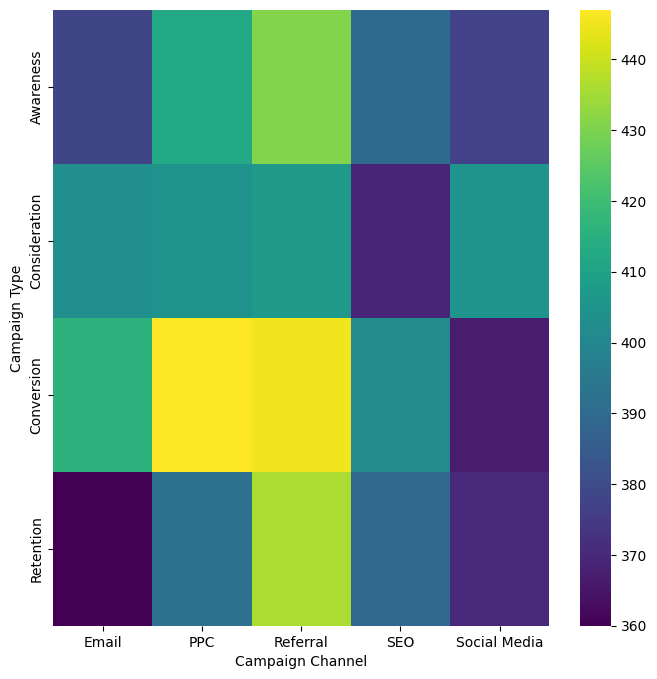

In [55]:

plt.subplots(figsize=(8,8), )

df_ = pd.DataFrame({x_label: grp['CampaignType'].value_counts()for x_label, grp in data.groupby('CampaignChannel')})


sns.heatmap(df_, cmap='viridis')
plt.xlabel('Campaign Channel')
plt.ylabel('Campaign Type')
plt.show()

#CONCLUSION FOR PROBLEM STATEMENT 3:
For awareness and consideration best campaign channel is refrerral, For conversion PPC is the best campaign channel followed by referral and for retention also best channel is Referral.

#PROBLEM STATEMENT 4:
RELATIONSHIP BETWEEN **ADSPEND** AND VARIOUS OUTCOMES OF DIGITAL MARKETING CAMPAIGN

In [56]:
response_columns=['ClickThroughRate', 'ConversionRate', 'WebsiteVisits', 'PagesPerVisit','TimeOnSite', 'SocialShares', 'EmailOpens', 'EmailClicks']

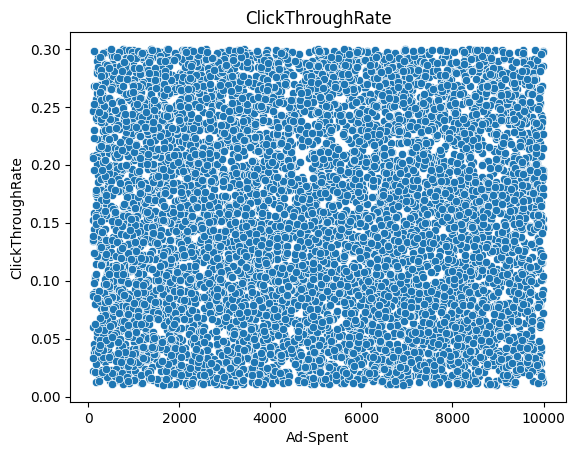

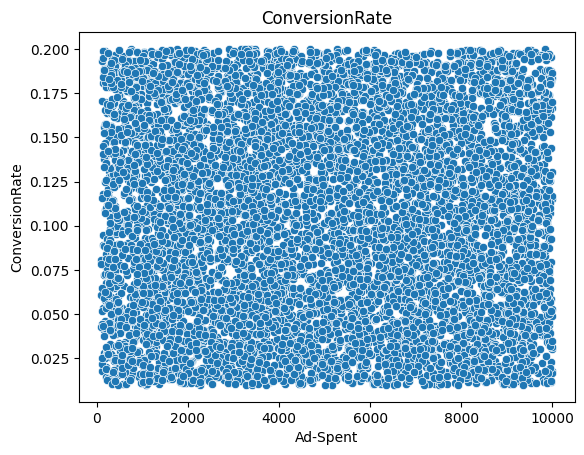

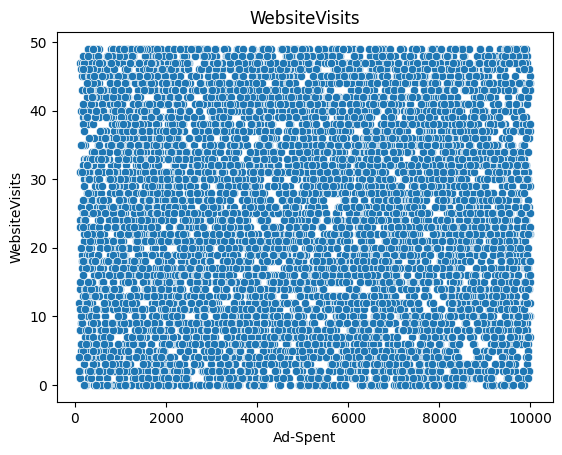

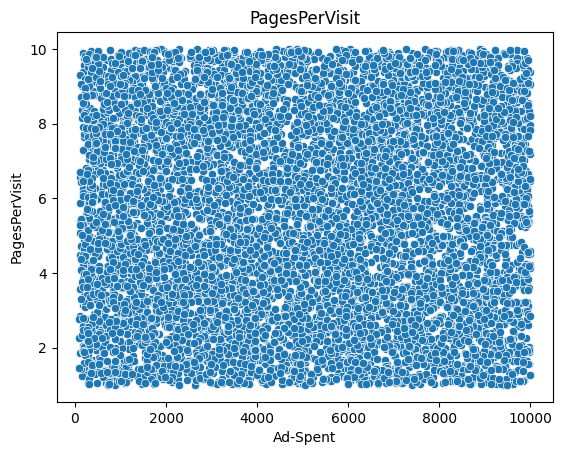

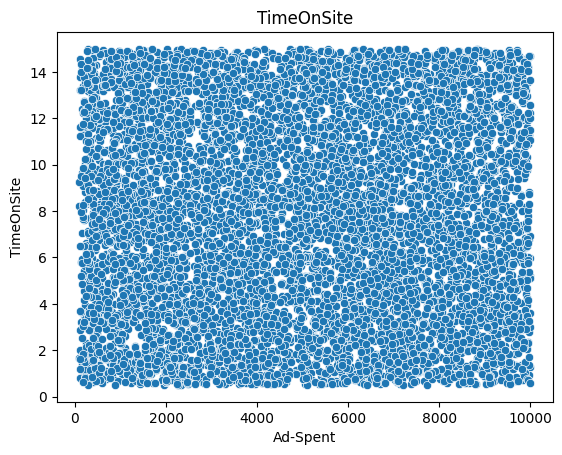

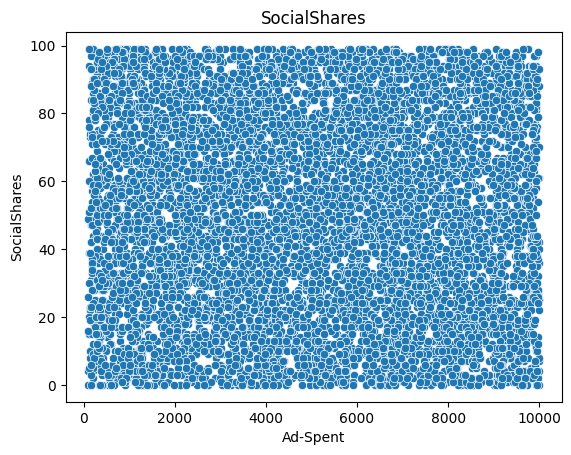

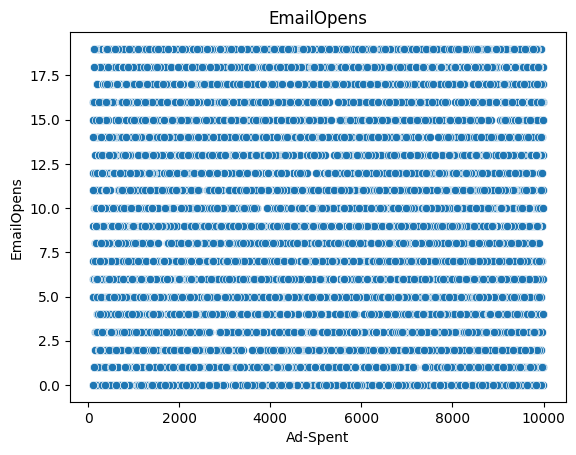

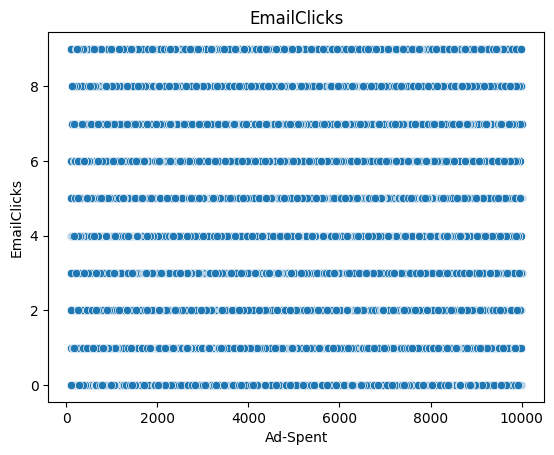

In [57]:

for col in response_columns:
  sns.scatterplot(data=data, x='AdSpend', y=col)
  plt.title(col)
  plt.xlabel("Ad-Spent")
  plt.ylabel(col)
  plt.show()

AFTER ANALYSIS IT IS CLEARLY EVIDENT THAT THE VARIOUS MARKETING OUTCOME PARAMETERS NIETHER SHARE A LINEAR RELATION WITH THE AD-SPEND NOR A MONOTONIC ONE.SO,
* LINEAR REGRESSION AND SPEARMEN TEST CAN NOT BE USED TO ESTABLISH ANY SORT OF CORELATION

SO,
KENDALMAN TAU TEST WILL BE DONE TO FIND THE REQUIRED RELATIONSHIP.

* CONCORDANT POINTS: IF (X1>X2) THEN (Y1>Y2) AND VICE VERSA
* DISCORDANT POINTS: IF (X1>X2) THEN(Y1<Y2)

In [58]:
from os import P_ALL
from scipy.stats import kendalltau

alpha =0.2
for col in response_columns:
  tau, p_value= kendalltau(data['AdSpend'], data[col])


  #print results
  print(f"(H0):  THERE IS NO  ASSOCIATION BETWEEN  'SPENT ON ADDS' AND {col}")
  print(f"(H1):  THERE IS ASSOCIATION BETWEEN  'SPENT ON ADDS' AND {col}")
  print(f"Tau: {tau}")
  print(f"P-Value: {p_value}")


  #determine the result

  if p_value<alpha:
    print("reject null hypothesis")
    print(f" There is  a statisticall association  between add spent and {col}")
  else:
    print("accept null hypothesis")
    print(f" There is no  a statisticall association  between add spent and {col}")
  print("\n")

(H0):  THERE IS NO  ASSOCIATION BETWEEN  'SPENT ON ADDS' AND ClickThroughRate
(H1):  THERE IS ASSOCIATION BETWEEN  'SPENT ON ADDS' AND ClickThroughRate
Tau: -0.0057115264408051
P-Value: 0.44360841842725485
accept null hypothesis
 There is no  a statisticall association  between add spent and ClickThroughRate


(H0):  THERE IS NO  ASSOCIATION BETWEEN  'SPENT ON ADDS' AND ConversionRate
(H1):  THERE IS ASSOCIATION BETWEEN  'SPENT ON ADDS' AND ConversionRate
Tau: -0.01336667083385423
P-Value: 0.07298333944635832
reject null hypothesis
 There is  a statisticall association  between add spent and ConversionRate


(H0):  THERE IS NO  ASSOCIATION BETWEEN  'SPENT ON ADDS' AND WebsiteVisits
(H1):  THERE IS ASSOCIATION BETWEEN  'SPENT ON ADDS' AND WebsiteVisits
Tau: 0.004570310102135176
P-Value: 0.5438502388688855
accept null hypothesis
 There is no  a statisticall association  between add spent and WebsiteVisits


(H0):  THERE IS NO  ASSOCIATION BETWEEN  'SPENT ON ADDS' AND PagesPerVisit
(H1): 

#PROBLEM STATEMENT 5:
WHICH CAMPAIGN IS BEST FOR WHICH PARAMETER

In [59]:
data.columns

Index(['Age', 'Gender', 'Income', 'CampaignChannel', 'CampaignType', 'AdSpend',
       'ClickThroughRate', 'ConversionRate', 'WebsiteVisits', 'PagesPerVisit',
       'TimeOnSite', 'SocialShares', 'EmailOpens', 'EmailClicks',
       'PreviousPurchases', 'LoyaltyPoints', 'Conversion', 'AgeCategory'],
      dtype='object')

In [60]:
df= data[['CampaignChannel','ClickThroughRate', 'ConversionRate', 'WebsiteVisits', 'PagesPerVisit',
       'TimeOnSite', 'SocialShares', 'EmailOpens', 'EmailClicks']]

In [61]:
df= df.groupby('CampaignChannel').mean()

In [62]:
df

,ClickThroughRate,ConversionRate,WebsiteVisits,PagesPerVisit,TimeOnSite,SocialShares,EmailOpens,EmailClicks
CampaignChannel,,,,,,,,
Email,0.155609,0.104884,24.878613,5.558488,7.679983,49.519589,9.484907,4.513166
PPC,0.158307,0.104132,24.155287,5.554004,7.841258,49.607251,9.302719,4.461631
Referral,0.151673,0.103051,24.890634,5.542450,7.651172,50.004654,9.593368,4.527632
SEO,0.153150,0.103530,24.740000,5.506669,7.617339,49.031613,9.423226,4.322581
Social Media,0.155523,0.106550,25.125741,5.586006,7.852198,50.848585,9.581303,4.506254


In [63]:
df.idxmax()

,0
ClickThroughRate,PPC
ConversionRate,Social Media
WebsiteVisits,Social Media
PagesPerVisit,Social Media
TimeOnSite,Social Media
SocialShares,Social Media
EmailOpens,Referral
EmailClicks,Referral


###CONCLUSIONS FOR PROBLEM STATEMENT 4 AND 5

- Extensive testing reveals no significant association between 'ad spend' and key engagement metrics such as Click-Through Rate (CTR), Website Visits, Pages Per Visit, Time on Site, and Email Clicks. This indicates that merely increasing ad spend does not guarantee enhanced user engagement across these dimensions. However, increased ad spending significantly effect critical performance indicators like Conversion Rate, Social Shares, and Email Opens. This demonstrates that while general engagement metrics remain unaffected, strategic ad spending can drive substantial chages in conversion and social engagement.

- Referral campaigns excel in driving Email Opens and Email Clicks. This indicates that leveraging personal recommendations within email marketing significantly enhances engagement, as recipients are more likely to open and interact with emails endorsed by people they know.

- Pay-Per-Click (PPC) campaigns are particularly effective for Click-Through Rates (CTR). This suggests that targeted ad placements that incentivize immediate user action can effectively drive higher click-through rates compared to other campaign types.

- Social Media campaigns lead in driving Conversion Rates, Website Visits, Pages Per Visit, Time on Site, and Social Shares. This underscores the platform's role in engaging users actively, encouraging extended site visits, and fostering sharing behaviors that amplify campaign impact.

#PROBLEM STATEMENT 6:

DOES HIGH WEBSITE VISITS, TIME SPENT ON SITE LEADS TO MORE CONVERSION RATE?

<Axes: xlabel='ConversionRate', ylabel='WebsiteVisits'>

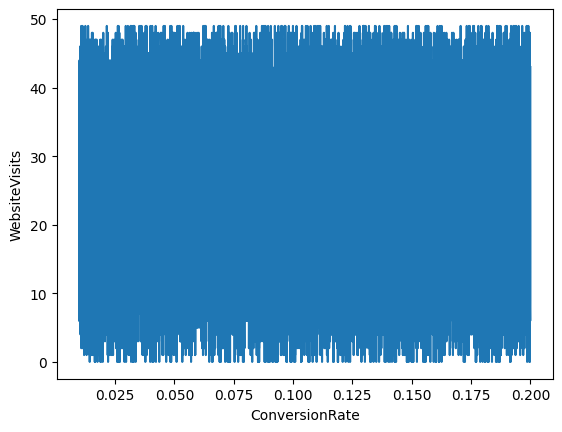

In [64]:
sns.lineplot(x='ConversionRate', y='WebsiteVisits', data=data)

In [65]:
df= data[['ConversionRate','WebsiteVisits','TimeOnSite']]

In [66]:
#null - no significant effect of  webiste visit on  conversion rate.
#alternate- An increase in website  visits leads  to a higher  conversion rate.

import statsmodels.api as sm

# Add constant for intercept
X = sm.add_constant(df['WebsiteVisits'])
y = df['ConversionRate']

# Fit the OLS regression model
model = sm.OLS(y, X)
results = model.fit()

# Extract the coefficient and standard error for WebsiteVisits
beta_website_visits = results.params['WebsiteVisits']
se_website_visits = results.bse['WebsiteVisits']

# Calculate the t-statistic
t_statistic = beta_website_visits / se_website_visits

# Get the p-value for the coefficient
p_value = results.pvalues['WebsiteVisits']

# Output the results
print(f"\nCoefficient for WebsiteVisits: {beta_website_visits}")
print(f"Standard Error for WebsiteVisits: {se_website_visits}")
print(f"T-statistic: {t_statistic}")
print(f"P-value: {p_value}")

# Conclusion based on the p-value
if p_value < 0.3:
    interpretation = "Reject the null hypothesis: An increase in website visits leads to a higher conversion rate."
else:
    interpretation = "Fail to reject the null hypothesis: No significant effect of website visits on conversion rate."

print(f"\nInterpretation: {interpretation}")



Coefficient for WebsiteVisits: -4.632148708256079e-05
Standard Error for WebsiteVisits: 4.2871609757703154e-05
T-statistic: -1.0804699740540478
P-value: 0.27996552959517884

Interpretation: Reject the null hypothesis: An increase in website visits leads to a higher conversion rate.


In [67]:
#null - no significant effect of  timeon site on  conversion rate.
#alternate- An increase in website  timeonsite  to a higher  conversion rate.

import statsmodels.api as sm

# Add constant for intercept
X = sm.add_constant(df['TimeOnSite'])
y = df['ConversionRate']

# Fit the OLS regression model
model = sm.OLS(y, X)
results = model.fit()

# Extract the coefficient and standard error for WebsiteVisits
beta_website_visits = results.params['TimeOnSite']
se_website_visits = results.bse['TimeOnSite']

# Calculate the t-statistic
t_statistic = beta_website_visits / se_website_visits

# Get the p-value for the coefficient
p_value = results.pvalues['TimeOnSite']

# Output the results
print(f"\nCoefficient for TimeOnSite: {beta_website_visits}")
print(f"Standard Error for TimeOnSite: {se_website_visits}")
print(f"T-statistic: {t_statistic}")
print(f"P-value: {p_value}")

# Conclusion based on the p-value
if p_value < 0.3:
    interpretation = "Reject the null hypothesis: An increase in time spent leads to a higher conversion rate."
else:
    interpretation = "Fail to reject the null hypothesis: No significant effect of time spent on conversion rate."

print(f"\nInterpretation: {interpretation}")



Coefficient for TimeOnSite: 0.00011264690856936402
Standard Error for TimeOnSite: 0.00014512299018936556
T-statistic: 0.7762168380239085
P-value: 0.43764391871067654

Interpretation: Fail to reject the null hypothesis: No significant effect of time spent on conversion rate.


In [68]:
x=df[['TimeOnSite','WebsiteVisits']]
y= df[['ConversionRate']]

X= sm.add_constant(x)
model= sm.OLS(y,X)
results= model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:         ConversionRate   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.8666
Date:                Mon, 19 Aug 2024   Prob (F-statistic):              0.420
Time:                        01:04:29   Log-Likelihood:                 11871.
No. Observations:                8000   AIC:                        -2.374e+04
Df Residuals:                    7997   BIC:                        -2.371e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.1047      0.002     62.389

#PROBLEM STATEMENT 7:
FOR EACH OUTCOME OF MARKETING WHICH CAMPAIGN CHANNEL IS BEST AS PER GENDER

In [69]:
data.columns

Index(['Age', 'Gender', 'Income', 'CampaignChannel', 'CampaignType', 'AdSpend',
       'ClickThroughRate', 'ConversionRate', 'WebsiteVisits', 'PagesPerVisit',
       'TimeOnSite', 'SocialShares', 'EmailOpens', 'EmailClicks',
       'PreviousPurchases', 'LoyaltyPoints', 'Conversion', 'AgeCategory'],
      dtype='object')

In [70]:
metrics=  ['ClickThroughRate', 'ConversionRate', 'WebsiteVisits', 'PagesPerVisit', 'TimeOnSite']


results= {}

for metric in metrics :
  metric_result = data.groupby(['Gender','CampaignChannel'])[metric].mean()
  best_channels= metric_result.groupby('Gender').idxmax()
  results[metric] = best_channels


#print the results
for metric, best_channels in results.items():
  print(f"Best Campaign Channel for {metric} by gender")
  print(best_channels)
  print()

Best Campaign Channel for ClickThroughRate by gender
Gender
Female           (Female, PPC)
Male      (Male, Social Media)
Name: ClickThroughRate, dtype: object

Best Campaign Channel for ConversionRate by gender
Gender
Female    (Female, Social Media)
Male        (Male, Social Media)
Name: ConversionRate, dtype: object

Best Campaign Channel for WebsiteVisits by gender
Gender
Female         (Female, Email)
Male      (Male, Social Media)
Name: WebsiteVisits, dtype: object

Best Campaign Channel for PagesPerVisit by gender
Gender
Female           (Female, PPC)
Male      (Male, Social Media)
Name: PagesPerVisit, dtype: object

Best Campaign Channel for TimeOnSite by gender
Gender
Female    (Female, Social Media)
Male                 (Male, PPC)
Name: TimeOnSite, dtype: object



#CONCLUSIONS FOR PROBLEM STATEMENTS 6 AND 7:
### CONCLUSIONS

-  On researching to find is there any relationship between increase in website visit and higher conversion rate it was found statistically that an increase in website visits leads to a higher conversion rate, however there is No significant effect of Time Spent on Website  and on conversion rate.

- while trying to figure out the combined effect of website visit and time spent on website we found that The F-statistic of 0.8666 is relatively low.
The associated p-value of 0.420 is higher than the commonly accepted significance level of 0.3,
This combination indicates that the model, using TimeOnSite and WebsiteVisits to predict ConversionRate.
does not provide strong evidence that these variables together reliably predict how often visitors convert on the website.

- Best campaign channel for each markting output gender wise
- For ClickThroughRate:
- - Female: PPC campaign performs best.
- - Male: Social Media campaign performs best.

- For ConversionRate:
- - Female: Social Media campaign performs best.
- - Male: Social Media campaign performs best.

- For WebsiteVisits:
- - Female: Email campaign attracts more visits.
- - Male: Social Media campaign attracts more visits.

- For PagesPerVisit:
- - Female: PPC campaign results in more pages per visit.
- - Male: Social Media campaign results in more pages per visit.

For TimeOnSite:
- - Female: Social Media campaign leads to longer time on site.
- - Male: PPC campaign leads to longer time on site.

In [71]:
print("EDA COMPLETED")

EDA COMPLETED
